In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression 

In [5]:
pd.set_option('display.max_columns', None)

In [2]:
import os
os.getcwd()

'c:\\kaggle'

In [3]:
from pathlib import Path

PROJECT_ROOT = Path.cwd() 
# load the datasets
# team_stats = pd.read_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatistics.csv')
team_stats_recent = pd.read_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatisticsFrom2010.csv')

C:\Users\zhang\AppData\Local\Temp\ipykernel_1236\2962766577.py:6: DtypeWarning: Columns (0: gameLabel, 1: gameSubLabel) have mixed types. Specify dtype option on import or set low_memory=False.
  team_stats_recent = pd.read_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatisticsFrom2010.csv')


In [4]:
team_stats_recent

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,...,percentUnassisted3PointMade,percentAssistedFieldGoalsMade,percentUnassistedFieldGoalsMade,freeThrowAttemptRate,opponentEffectiveFieldGoalPercentage,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season
0,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612759,San Antonio,Spurs,1610612752,...,0.167,0.545,0.455,0.221,0.425,0.322,0.154,0.407,2026-06-13,2025
1,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612752,New York,Knicks,1610612759,...,0.250,0.452,0.548,0.322,0.453,0.221,0.144,0.339,2026-06-13,2025
2,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612759,San Antonio,Spurs,1610612752,...,0.059,0.667,0.333,0.233,0.558,0.359,0.161,0.283,2026-06-10,2025
3,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612752,New York,Knicks,1610612759,...,0.000,0.639,0.361,0.359,0.517,0.233,0.128,0.308,2026-06-10,2025
4,42500403,2026-06-08 20:30:00,Playoffs,NBA Finals,Game 3,3.0,1610612759,San Antonio,Spurs,1610612752,...,0.083,0.718,0.282,0.381,0.528,0.250,0.140,0.373,2026-06-08,2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43541,11000004,2010-10-05 19:00:00,NaN,NaN,NaN,NaN,1610612739,Cleveland,Cavaliers,1610612766,...,0.000,0.536,0.464,0.455,0.329,0.354,0.173,0.262,2010-10-05,2010
43542,11000007,2010-10-05 19:00:00,NaN,NaN,NaN,NaN,1610612751,New Jersey,Nets,1610612755,...,0.125,0.667,0.333,0.493,0.389,0.681,0.094,NaN,2010-10-05,2010
43543,11000007,2010-10-05 19:00:00,NaN,NaN,NaN,NaN,1610612755,Philadelphia,76ers,1610612751,...,1.000,0.519,0.481,0.681,0.563,0.493,0.189,NaN,2010-10-05,2010
43544,11000003,2010-10-04 15:00:00,NaN,NaN,NaN,NaN,1610612750,Minnesota,Timberwolves,1610612747,...,0.125,0.650,0.350,0.432,0.468,0.418,0.222,0.358,2010-10-04,2010


In [12]:
team_stats_recent['gameType'].value_counts(dropna=False)

gameType
Regular Season        35768
NaN                    5196
Playoffs               2504
Play-in Tournament       62
Emirates NBA Cup          2
Name: count, dtype: int64

In [13]:
team_stats_recent['teamName'].value_counts(dropna=False)

teamName
Heat              1562
Celtics           1553
Warriors          1535
Thunder           1510
Spurs             1492
Nuggets           1486
Pacers            1479
Cavaliers         1474
Clippers          1474
Lakers            1468
Raptors           1462
Rockets           1460
Mavericks         1460
Grizzlies         1460
Bucks             1460
Hawks             1458
76ers             1457
Knicks            1438
Trail Blazers     1434
Bulls             1427
Suns              1414
Jazz              1414
Timberwolves      1412
Magic             1408
Wizards           1404
Nets              1404
Pistons           1384
Kings             1370
Hornets           1285
Pelicans          1140
Bobcats            342
Loong-Lions          3
Phoenix              1
Jerusalem B.C.       1
United               1
Name: count, dtype: int64

In [14]:
exclude_teams = ['Loong-Lions', 'Phoenix', 'Jerusalem B.C.', 'United']
team_stats_recent = team_stats_recent[~team_stats_recent['teamName'].isin(exclude_teams)]

In [15]:
team_stats_recent['teamName'].value_counts(dropna=False)

teamName
Heat             1562
Celtics          1553
Warriors         1535
Thunder          1510
Spurs            1492
Nuggets          1486
Pacers           1479
Cavaliers        1474
Clippers         1474
Lakers           1468
Raptors          1462
Rockets          1460
Mavericks        1460
Grizzlies        1460
Bucks            1460
Hawks            1458
76ers            1457
Knicks           1438
Trail Blazers    1434
Bulls            1427
Suns             1414
Jazz             1414
Timberwolves     1412
Magic            1408
Wizards          1404
Nets             1404
Pistons          1384
Kings            1370
Hornets          1285
Pelicans         1140
Bobcats           342
Name: count, dtype: int64

In [16]:
team_stats_recent['gameLabel'].value_counts(dropna=False)

gameLabel
NaN                        40520
West - First Round           582
East - First Round           554
Emirates NBA Cup             400
East - Conf. Semifinals      304
West - Conf. Semifinals      292
NBA Finals                   170
East - Conf. Finals          152
West - Conf. Finals          136
East First Round              94
West First Round              88
East Conf. Semifinals         44
West Conf. Semifinals         44
West Conf. Finals             24
SoFi Play-In Tournament       24
AWS NBA Rivals Week           22
East Conf. Finals             20
West Play-In                  18
East Play-In                  18
NBA Mexico City Game           6
NBA Paris Games                4
NBA Pioneers Classic           2
NBA London Game                2
NBA Berlin Game                2
NBA Paris Game                 2
NBA Cup                        2
Name: count, dtype: int64

In [8]:
# Some of the games are not compectitive: the all-star weekend
exclude_labels = ['All-Star', 'All-Star Championship', 'Rising Stars Semifinal', 'Rising Stars Final',]

team_stats_recent = team_stats_recent[~team_stats_recent['gameLabel'].isin(exclude_labels)]

In [18]:
team_stats_recent['gameLabel'].value_counts(dropna=False)

gameLabel
NaN                        40520
West - First Round           582
East - First Round           554
Emirates NBA Cup             400
East - Conf. Semifinals      304
West - Conf. Semifinals      292
NBA Finals                   170
East - Conf. Finals          152
West - Conf. Finals          136
East First Round              94
West First Round              88
East Conf. Semifinals         44
West Conf. Semifinals         44
West Conf. Finals             24
SoFi Play-In Tournament       24
AWS NBA Rivals Week           22
East Conf. Finals             20
West Play-In                  18
East Play-In                  18
NBA Mexico City Game           6
NBA Paris Games                4
NBA Pioneers Classic           2
NBA London Game                2
NBA Berlin Game                2
NBA Paris Game                 2
NBA Cup                        2
Name: count, dtype: int64

In [ ]:
# these are real NBA games and will be kept
international_labels = [
    'NBA Mexico City Game',
    'NBA Paris Games',
    'NBA Paris Game',
    'NBA London Game',
    'NBA Berlin Game',
    'NBA Pioneers Classic',
]

mask = team_stats_recent['gameLabel'].isin(international_labels)
team_stats_recent[mask]

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,opponentTeamCity,opponentTeamName,home,win,teamScore,opponentScore,seed,numMinutes,assists,steals,blocks,blocksAgainst,fieldGoalsMade,fieldGoalsAttempted,fieldGoalsPercentage,threePointersMade,threePointersAttempted,threePointersPercentage,freeThrowsMade,freeThrowsAttempted,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,reboundsTotal,reboundsTeam,foulsPersonal,personalFoulsDrawn,turnovers,turnoversTeam,plusMinusPoints,q1Points,q2Points,q3Points,q4Points,ot1Points,ot2Points,otAllPoints,benchPoints,biggestLead,biggestScoringRun,leadChanges,pointsFastBreak,pointsFromTurnovers,pointsInThePaint,pointsSecondChance,timesTied,timeoutsRemaining,seasonWins,seasonLosses,estimatedOffensiveRating,offensiveRating,estimatedDefensiveRating,defensiveRating,estimatedNetRating,netRating,assistPercentage,assistToTurnoverRatio,assistRatio,offensiveReboundPercentage,defensiveReboundPercentage,reboundPercentage,teamTurnoverPercentage,effectiveFieldGoalPercentage,trueShootingPercentage,estimatedPace,pace,pacePer40,possessions,playerImpactEstimate,pointsOffTurnovers,opponentPointsOffTurnovers,opponentPointsSecondChance,opponentPointsFastBreak,opponentPointsInPaint,percentFieldGoalAttempts2Point,percentFieldGoalAttempts3Point,percentPoints2Point,percentPoints2PointMidRange,percentPoints3Point,percentPointsFastBreak,percentPointsFreeThrow,percentPointsOffTurnovers,percentPointsInPaint,percentAssisted2PointMade,percentUnassisted2PointMade,percentAssisted3PointMade,percentUnassisted3PointMade,percentAssistedFieldGoalsMade,percentUnassistedFieldGoalsMade,freeThrowAttemptRate,opponentEffectiveFieldGoalPercentage,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season
1196,22500702,2026-02-01 15:30:00,Regular Season,NBA Pioneers Classic,NaN,NaN,1610612738,Boston,Celtics,1610612749,Milwaukee,Bucks,1,1,107,79,NaN,240.0,24,4,2,0,41,92,0.446,15,42,0.357,10,13,0.769,17,35,52,9.0,16,17,9,1.0,28.0,26.0,30.0,22.0,29.0,NaN,NaN,NaN,36.0,31.0,11.0,1.0,11.0,15.0,42.0,16.0,1.0,1.0,31.0,18.0,117.9,124.4,90.2,90.8,27.8,33.6,0.585,2.40,18.2,0.407,0.709,0.560,0.116,0.527,0.547,89.2,86.5,72.08,86,0.666,15.0,8.0,13.0,1.0,28.0,0.543,0.457,0.486,0.093,0.421,0.103,0.093,0.140,0.393,0.538,0.462,0.667,0.333,0.585,0.415,0.141,0.415,0.183,0.126,0.291,2026-02-01,2025
1197,22500702,2026-02-01 15:30:00,Regular Season,NBA Pioneers Classic,NaN,NaN,1610612749,Milwaukee,Bucks,1610612738,Boston,Celtics,0,0,79,107,NaN,240.0,17,5,0,2,29,82,0.354,10,34,0.294,11,15,0.733,12,28,40,10.0,17,16,10,1.0,-28.0,26.0,16.0,19.0,18.0,NaN,NaN,NaN,20.0,12.0,12.0,1.0,1.0,8.0,28.0,13.0,1.0,1.0,18.0,29.0,90.2,90.8,117.9,124.4,-27.8,-33.6,0.586,1.55,14.2,0.291,0.593,0.440,0.126,0.415,0.446,89.2,86.5,72.08,87,0.334,8.0,15.0,16.0,11.0,42.0,0.585,0.415,0.481,0.127,0.380,0.013,0.139,0.101,0.354,0.368,0.632,1.000,0.000,0.586,0.414,0.183,0.527,0.141,0.116,0.407,2026-02-01,2025
1402,22500602,2026-01-18 12:00:00,Regular Season,NBA London Game,NaN,NaN,1610612763,Memphis,Grizzlies,1610612753,Orlando,Magic,1,1,126,109,NaN,240.0,31,12,7,6,48,91,0.527,13,35,0.371,17,25,0.680,9,33,42,11.0,18,20,12,0.0,17.0,40.0,32.0,28.0,26.0,NaN,NaN,NaN,53.0,33.0,15.0,0.0,10.0,16.0,58.0,19.0,0.0,1.0,18.0,23.0,120.0,123.5,101.8,109.0,18.2,14.5,0.646,2.58,21.1,0.319,0.642,0.490,0.118,0.599,0.618,106.0,101.0,84.17,102,0.584,16.0,14.0,29.0,9.0,60.0,0.615,0.385,0.556,0.095,0.310,0.079,0.135,0.127,0.460,0.543,0.457,0.923,0.077,0.646,0.354,0.275,0.495,0.168,0.170,0.358,2026-01-18,2025
1403,22500602,2026-01-18 12:00:00,Regular Season,NBA London Game,NaN,NaN,1610612753,Orlando,Magic,1610612763,Memphis,Grizzlies,0,0,109,126,NaN,240.0,30,5,6,7,42,95,0.442,10,33,0.303,15,16,0.938,12,30,42,10.0,20,18,17,0.0,-17.0,23.0,30.0,28.0,28.0,NaN,NaN,NaN,31.0,0.0,9.0,0.0,9.0,14.0,60.0,29.0,0.0,1.0,23.0,19.0,101.8,109.0,120.0,123.5,-18.2,-14.5,0.714,1.76,20.1,0.358,0.681,0.510,0.170,0.495,0.534

In [20]:
team_stats_recent.columns.to_list()

['gameId',
 'gameDateTimeEst',
 'gameType',
 'gameLabel',
 'gameSubLabel',
 'seriesGameNumber',
 'teamId',
 'teamCity',
 'teamName',
 'opponentTeamId',
 'opponentTeamCity',
 'opponentTeamName',
 'home',
 'win',
 'teamScore',
 'opponentScore',
 'seed',
 'numMinutes',
 'assists',
 'steals',
 'blocks',
 'blocksAgainst',
 'fieldGoalsMade',
 'fieldGoalsAttempted',
 'fieldGoalsPercentage',
 'threePointersMade',
 'threePointersAttempted',
 'threePointersPercentage',
 'freeThrowsMade',
 'freeThrowsAttempted',
 'freeThrowsPercentage',
 'reboundsOffensive',
 'reboundsDefensive',
 'reboundsTotal',
 'reboundsTeam',
 'foulsPersonal',
 'personalFoulsDrawn',
 'turnovers',
 'turnoversTeam',
 'plusMinusPoints',
 'q1Points',
 'q2Points',
 'q3Points',
 'q4Points',
 'ot1Points',
 'ot2Points',
 'otAllPoints',
 'benchPoints',
 'biggestLead',
 'biggestScoringRun',
 'leadChanges',
 'pointsFastBreak',
 'pointsFromTurnovers',
 'pointsInThePaint',
 'pointsSecondChance',
 'timesTied',
 'timeoutsRemaining',
 'seas

In [31]:
team_stats_recent['seasonWins'].value_counts(dropna=False)

seasonWins
NaN     4924
1.0     1756
2.0     1671
3.0     1473
4.0     1309
        ... 
69.0       2
73.0       1
72.0       1
71.0       1
70.0       1
Name: count, Length: 75, dtype: int64

In [32]:
team_stats_recent['seasonLosses'].value_counts(dropna=False)

seasonLosses
NaN     4924
1.0     1803
2.0     1636
3.0     1527
4.0     1317
        ... 
68.0       3
72.0       1
71.0       1
70.0       1
69.0       1
Name: count, Length: 74, dtype: int64

In [33]:
team_stats_recent['plusMinusPoints'].value_counts(dropna=False)

plusMinusPoints
-5.0     1351
 5.0     1351
-7.0     1343
 7.0     1343
 6.0     1330
         ... 
 68.0       1
-57.0       1
 57.0       1
-61.0       1
 61.0       1
Name: count, Length: 129, dtype: int64

In [34]:
team_stats_recent['blocks'].value_counts(dropna=False)

blocks
4     7289
5     6656
3     6390
6     5409
2     4442
7     3966
8     2689
1     2281
9     1644
10     994
0      641
11     568
12     284
13     148
14      62
15      34
16      11
17       9
18       5
19       3
20       1
Name: count, dtype: int64

In [35]:
team_stats_recent['teamScore'].value_counts(dropna=False)

teamScore
104    1302
105    1263
103    1239
109    1210
107    1208
       ... 
168       1
61        1
58        1
60        1
57        1
Name: count, Length: 109, dtype: int64

In [36]:
# trim the dataset a little bit
keep_cols = [
    'gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId', 'opponentTeamName','home', 'win',
    'teamScore', 'opponentScore','fieldGoalsPercentage', 'threePointersPercentage', 'freeThrowsPercentage',
    'reboundsOffensive', 'reboundsDefensive', 'assists', 'turnovers', 'steals', 'blocks',
    'plusMinusPoints', 
]

team_stats_recent_trim = team_stats_recent[keep_cols].copy()

In [37]:
# change it to inceasing order for the gameDate
team_stats_recent_trim = team_stats_recent_trim.sort_values(['teamId', 'gameDate']).reset_index(drop=True)

In [38]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,opponentScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints
0,11000017,2010-10-07,2010,1610612737,Hawks,1610612763,Grizzlies,1,0,111,115,0.519,0.222,0.614,9,30,26,26,9,1,-4.0
1,11000043,2010-10-11,2010,1610612737,Hawks,1610612765,Pistons,0,0,85,94,0.441,0.538,0.692,9,32,22,21,6,2,-9.0
2,11000050,2010-10-12,2010,1610612737,Hawks,1610612764,Wizards,0,0,92,107,0.513,0.500,0.400,7,24,19,16,5,3,-15.0
3,11000079,2010-10-16,2010,1610612737,Hawks,1610612740,Hornets,0,1,84,74,0.406,0.278,0.676,5,31,18,16,9,6,10.0
4,11000087,2010-10-18,2010,1610612737,Hawks,1610612753,Magic,1,0,73,102,0.308,0.188,0.759,9,24,15,6,7,2,-29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43521,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,113,0.432,0.327,0.769,14,26,24,12,5,3,-11.0
43522,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,118,0.386,0.277,0.826,14,27,16,15,10,8,-18.0
43523,22501190,2026-04-12,2025,1610612766,Hornets,1610612752,Knicks,0,1,110,96,0.459,0.365,0.765,12,34,27,17,7,7,14.0
43524,52500111,2026-04-14,2025,1610612766,Hornets,1610612748,Heat,1,1,127,126,0.442,0.321,1.000,17,37,26,6,4,7,1.0


In [26]:
# note that some teams changed names after 2010. Verify that Team ID stays the same.
team_stats_recent_trim[team_stats_recent_trim['teamName'].isin(['Bobcats', 'Hornets', 'Pelicans'])][['teamId', 'teamName']].drop_duplicates()

,teamId,teamName
4485,1610612740,Hornets
4739,1610612740,Pelicans
42153,1610612766,Bobcats
42495,1610612766,Hornets


In [39]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,opponentScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints
0,11000017,2010-10-07,2010,1610612737,Hawks,1610612763,Grizzlies,1,0,111,115,0.519,0.222,0.614,9,30,26,26,9,1,-4.0
1,11000043,2010-10-11,2010,1610612737,Hawks,1610612765,Pistons,0,0,85,94,0.441,0.538,0.692,9,32,22,21,6,2,-9.0
2,11000050,2010-10-12,2010,1610612737,Hawks,1610612764,Wizards,0,0,92,107,0.513,0.500,0.400,7,24,19,16,5,3,-15.0
3,11000079,2010-10-16,2010,1610612737,Hawks,1610612740,Hornets,0,1,84,74,0.406,0.278,0.676,5,31,18,16,9,6,10.0
4,11000087,2010-10-18,2010,1610612737,Hawks,1610612753,Magic,1,0,73,102,0.308,0.188,0.759,9,24,15,6,7,2,-29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43521,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,113,0.432,0.327,0.769,14,26,24,12,5,3,-11.0
43522,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,118,0.386,0.277,0.826,14,27,16,15,10,8,-18.0
43523,22501190,2026-04-12,2025,1610612766,Hornets,1610612752,Knicks,0,1,110,96,0.459,0.365,0.765,12,34,27,17,7,7,14.0
43524,52500111,2026-04-14,2025,1610612766,Hornets,1610612748,Heat,1,1,127,126,0.442,0.321,1.000,17,37,26,6,4,7,1.0


In [40]:
team_stats_recent_trim.to_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatisticsFrom2010trim.csv', index=False)

In [41]:
# Select the features for rolling average. Check these rows for anormaly 
roll_cols = [
    'teamScore', 'fieldGoalsPercentage', 'threePointersPercentage',
    'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
    'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints', 'win',
]

In [42]:
team_stats_recent_trim[roll_cols].describe()

,teamScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints,win
count,43526.000000,43526.000000,43526.000000,43526.000000,43526.000000,43526.000000,43526.000000,43526.000000,43526.000000,43526.000000,43491.000000,43526.000000
mean,106.724418,0.459798,0.354960,0.767155,10.578091,32.942035,23.607522,14.283601,7.750425,4.886482,0.020602,0.500069
std,13.824584,0.055885,0.095746,0.102644,3.869010,5.505627,5.375243,4.034023,2.963247,2.527088,14.520389,0.500006
min,56.000000,0.246000,0.000000,0.000000,0.000000,12.000000,4.000000,1.000000,0.000000,0.000000,-73.000000,0.000000
25%,97.000000,0.421000,0.293000,0.703000,8.000000,29.000000,20.000000,11.000000,6.000000,3.000000,-9.000000,0.000000
50%,106.000000,0.459000,0.354000,0.773000,10.000000,33.000000,23.000000,14.000000,8.000000,5.000000,1.000000,1.000000
75%,116.000000,0.500000,0.417000,0.839000,13.000000,37.000000,27.000000,17.000000,10.000000,6.000000,9.000000,1.000000
max,176.000000,0.689000,0.842000,1.000000,38.000000,60.000000,50.000000,34.000000,22.000000,20.000000,73.000000,1.000000


In [43]:
# Compute the rolling average for the past 10 games
window = 10

for col in roll_cols:
    team_stats_recent_trim[f'{col}_roll{window}'] = (
        team_stats_recent_trim.groupby('teamId')[col]
        .transform(lambda x: x.shift(1).rolling(window=window, min_periods=1).mean())
    )

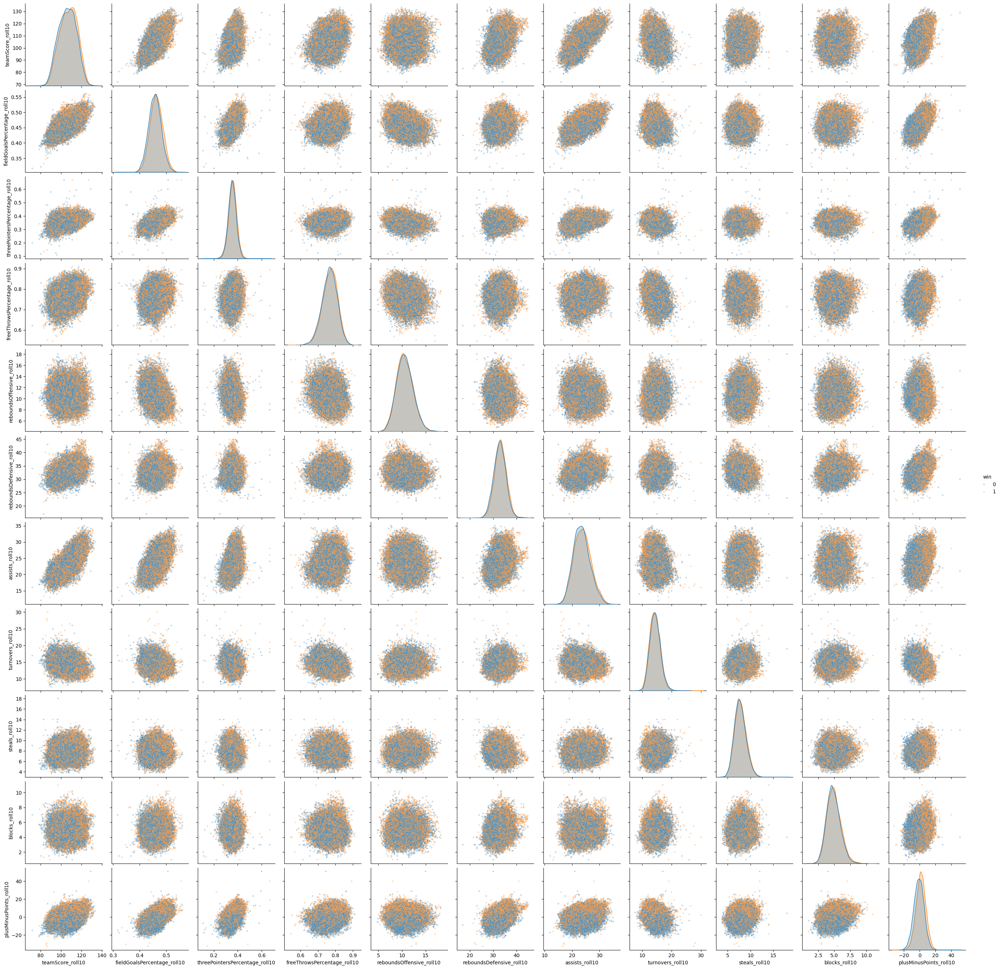

In [44]:
# plot of the rolling features: does not make a lot of sense, just to have a sense of the data
roll_feature_cols = [f'{col}_roll{window}' for col in roll_cols if col != 'win']

sns.pairplot(
    team_stats_recent_trim.dropna(subset=roll_feature_cols),
    vars=roll_feature_cols,
    hue='win',
    plot_kws={'alpha': 0.3, 's': 10}
)

In [45]:
team_stats_recent_trim.to_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatisticsFrom2010Roll10.csv', index=False)

In [46]:
team_stats_recent_trim.columns

Index(['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'fieldGoalsPercentage', 'threePointersPercentage',
       'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
       'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints',
       'teamScore_roll10', 'fieldGoalsPercentage_roll10',
       'threePointersPercentage_roll10', 'freeThrowsPercentage_roll10',
       'reboundsOffensive_roll10', 'reboundsDefensive_roll10',
       'assists_roll10', 'turnovers_roll10', 'steals_roll10', 'blocks_roll10',
       'plusMinusPoints_roll10', 'win_roll10'],
      dtype='str')

In [47]:
roll_cols = [
    'teamScore_roll10', 'fieldGoalsPercentage_roll10',
    'threePointersPercentage_roll10', 'freeThrowsPercentage_roll10',
    'reboundsOffensive_roll10', 'reboundsDefensive_roll10',
    'assists_roll10', 'turnovers_roll10', 'steals_roll10',
    'blocks_roll10', 'plusMinusPoints_roll10', 'win_roll10'
]

In [57]:

home = team_stats_recent_trim[team_stats_recent_trim['home'] == 1][
    ['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'win'] + roll_cols
].rename(columns={col: f'home_{col}' for col in roll_cols})

home

,gameId,gameDate,season,teamId,teamName,win,home_teamScore_roll10,home_fieldGoalsPercentage_roll10,home_threePointersPercentage_roll10,home_freeThrowsPercentage_roll10,home_reboundsOffensive_roll10,home_reboundsDefensive_roll10,home_assists_roll10,home_turnovers_roll10,home_steals_roll10,home_blocks_roll10,home_plusMinusPoints_roll10,home_win_roll10
0,11000017,2010-10-07,2010,1610612737,Hawks,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11000087,2010-10-18,2010,1610612737,Hawks,0,93.000000,0.469750,0.384500,0.595500,7.500000,29.250000,21.250000,19.75,7.250000,3.000000,-4.500000,0.250000
5,11000110,2010-10-21,2010,1610612737,Hawks,1,89.000000,0.437400,0.345200,0.628200,7.800000,28.200000,20.000000,17.00,7.200000,2.800000,-9.400000,0.200000
9,21000031,2010-10-30,2010,1610612737,Hawks,1,92.444444,0.441556,0.367667,0.695889,8.444444,30.888889,19.555556,17.00,6.555556,4.444444,-5.888889,0.444444
11,21000054,2010-11-03,2010,1610612737,Hawks,1,92.000000,0.431500,0.364400,0.721600,9.400000,30.700000,19.500000,15.10,6.100000,5.000000,-3.300000,0.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43516,22501085,2026-03-29,2025,1610612766,Hornets,0,117.300000,0.463500,0.398300,0.796900,13.100000,33.300000,25.500000,14.10,7.100000,4.000000,10.800000,0.700000
43518,22501114,2026-04-02,2025,1610612766,Hornets,1,118.700000,0.473400,0.386900,0.817100,12.500000,33.000000,25.700000,13.60,6.700000,3.500000,13.400000,0.700000
43519,22501120,2026-04-03,2025,1610612766,Hornets,1,119.700000,0.479400,0.376100,0.809700,12.300000,33.800000,25.500000,13.20,6.600000,3.800000,14.600000,0.700000
43522,22501171,2026-04-10,2025,1610612766,Hornets,0,118.200000,0.476200,0.378400,0.807700,13.400000,33.300000,26.300000,12.40,6.000000,3.500000,13.400000,0.700000


In [54]:

away = team_stats_recent_trim[team_stats_recent_trim['home'] == 0][
    ['gameId', 'teamId', 'teamName'] + roll_cols
].rename(columns={col: f'away_{col}' for col in roll_cols})

away

,gameId,teamId,teamName,away_teamScore_roll10,away_fieldGoalsPercentage_roll10,away_threePointersPercentage_roll10,away_freeThrowsPercentage_roll10,away_reboundsOffensive_roll10,away_reboundsDefensive_roll10,away_assists_roll10,away_turnovers_roll10,away_steals_roll10,away_blocks_roll10,away_plusMinusPoints_roll10,away_win_roll10
1,11000043,1610612737,Hawks,111.0,0.519000,0.222000,0.614000,9.000000,30.000000,26.000000,26.000000,9.000000,1.000000,-4.000000,0.000000
2,11000050,1610612737,Hawks,98.0,0.480000,0.380000,0.653000,9.000000,31.000000,24.000000,23.500000,7.500000,1.500000,-6.500000,0.000000
3,11000079,1610612737,Hawks,96.0,0.491000,0.420000,0.568667,8.333333,28.666667,22.333333,21.000000,6.666667,2.000000,-9.333333,0.000000
6,11000111,1610612737,Hawks,90.5,0.435167,0.365500,0.640833,7.666667,30.333333,20.500000,15.833333,7.333333,2.666667,-6.333333,0.333333
7,21000008,1610612737,Hawks,87.0,0.419286,0.350857,0.650429,8.142857,29.571429,18.857143,16.857143,7.000000,3.285714,-10.142857,0.285714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43517,22501100,1610612766,Hornets,117.3,0.464900,0.392900,0.809100,12.800000,33.200000,25.000000,14.100000,7.200000,3.500000,10.500000,0.700000
43520,22501137,1610612766,Hornets,122.4,0.489700,0.391800,0.814000,12.400000,34.600000,26.800000,13.200000,6.700000,3.500000,18.000000,0.800000
43521,22501149,1610612766,Hornets,121.0,0.485500,0.393500,0.819700,13.000000,33.800000,26.700000,13.400000,6.400000,3.400000,16.400000,0.800000
43523,22501190,1610612766,Hornets,115.8,0.461900,0.364200,0.823600,13.500000,32.400000,25.400000,12.200000,6.300000,3.900000,9.300000,0.600000


In [58]:
matchups = home.merge(away, on='gameId', suffixes=('_home', '_away'))

matchups

,gameId,gameDate,season,teamId_home,teamName_home,win,home_teamScore_roll10,home_fieldGoalsPercentage_roll10,home_threePointersPercentage_roll10,home_freeThrowsPercentage_roll10,home_reboundsOffensive_roll10,home_reboundsDefensive_roll10,home_assists_roll10,home_turnovers_roll10,home_steals_roll10,home_blocks_roll10,home_plusMinusPoints_roll10,home_win_roll10,teamId_away,teamName_away,away_teamScore_roll10,away_fieldGoalsPercentage_roll10,away_threePointersPercentage_roll10,away_freeThrowsPercentage_roll10,away_reboundsOffensive_roll10,away_reboundsDefensive_roll10,away_assists_roll10,away_turnovers_roll10,away_steals_roll10,away_blocks_roll10,away_plusMinusPoints_roll10,away_win_roll10
0,11000017,2010-10-07,2010,1610612737,Hawks,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1610612763,Grizzlies,87.00,0.46500,0.29400,0.552000,13.0,36.00,16.00,30.00,10.000,4.0,2.0,1.000
1,11000087,2010-10-18,2010,1610612737,Hawks,0,93.000000,0.469750,0.384500,0.595500,7.500000,29.250000,21.250000,19.75,7.250000,3.000000,-4.500000,0.250000,1610612753,Magic,103.20,0.50380,0.40360,0.753200,7.4,37.20,21.20,17.20,7.600,7.2,24.2,1.000
2,11000110,2010-10-21,2010,1610612737,Hawks,1,89.000000,0.437400,0.345200,0.628200,7.800000,28.200000,20.000000,17.00,7.200000,2.800000,-9.400000,0.200000,1610612748,Heat,90.60,0.42920,0.34000,0.795200,10.8,30.00,18.80,18.60,6.000,5.0,-2.8,0.400
3,21000031,2010-10-30,2010,1610612737,Hawks,1,92.444444,0.441556,0.367667,0.695889,8.444444,30.888889,19.555556,17.00,6.555556,4.444444,-5.888889,0.444444,1610612764,Wizards,93.75,0.43525,0.34125,0.668625,10.5,29.25,20.75,17.25,10.125,6.5,-3.0,0.375
4,21000054,2010-11-03,2010,1610612737,Hawks,1,92.000000,0.431500,0.364400,0.721600,9.400000,30.700000,19.500000,15.10,6.100000,5.000000,-3.300000,0.600000,1610612765,Pistons,95.20,0.43980,0.36700,0.744800,9.6,29.20,19.40,15.80,6.300,4.2,-4.4,0.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21755,22501085,2026-03-29,2025,1610612766,Hornets,0,117.300000,0.463500,0.398300,0.796900,13.100000,33.300000,25.500000,14.10,7.100000,4.000000,10.800000,0.700000,1610612738,Celtics,111.50,0.44660,0.34970,0.878000,11.9,35.80,24.10,12.40,6.100,2.8,5.2,0.700
21756,22501114,2026-04-02,2025,1610612766,Hornets,1,118.700000,0.473400,0.386900,0.817100,12.500000,33.000000,25.700000,13.60,6.700000,3.500000,13.400000,0.700000,1610612756,Suns,115.50,0.45270,0.36110,0.726900,12.9,29.70,26.50,11.30,8.900,4.7,3.6,0.300
21757,22501120,2026-04-03,2025,1610612766,Hornets,1,119.700000,0.479400,0.376100,0.809700,12.300000,33.800000,25.500000,13.20,6.600000,3.800000,14.600000,0.700000,1610612754,Pacers,121.40,0.51990,0.43010,0.814700,7.2,31.20,34.20,13.40,6.700,4.5,-3.9,0.300
21758,22501171,2026-04-10,2025,1610612766,Hornets,0,118.200000,0.476200,0.378400,0.807700,13.400000,33.300000,26.300000,12.40,6.000000,3.500000,13.400000,0.700000,1610612765,Pistons,119.00,0.51160,0.41820,0.779600,11.3,31.80,32.10,14.90,9.500,6.5,9.0,0.700


In [59]:
matchups.columns

Index(['gameId', 'gameDate', 'season', 'teamId_home', 'teamName_home', 'win',
       'home_teamScore_roll10', 'home_fieldGoalsPercentage_roll10',
       'home_threePointersPercentage_roll10',
       'home_freeThrowsPercentage_roll10', 'home_reboundsOffensive_roll10',
       'home_reboundsDefensive_roll10', 'home_assists_roll10',
       'home_turnovers_roll10', 'home_steals_roll10', 'home_blocks_roll10',
       'home_plusMinusPoints_roll10', 'home_win_roll10', 'teamId_away',
       'teamName_away', 'away_teamScore_roll10',
       'away_fieldGoalsPercentage_roll10',
       'away_threePointersPercentage_roll10',
       'away_freeThrowsPercentage_roll10', 'away_reboundsOffensive_roll10',
       'away_reboundsDefensive_roll10', 'away_assists_roll10',
       'away_turnovers_roll10', 'away_steals_roll10', 'away_blocks_roll10',
       'away_plusMinusPoints_roll10', 'away_win_roll10'],
      dtype='str')

In [ ]:
# find the difference of rolling average between home teams and visiting teams, which are more revelant to win/loss 
diff_cols = []
for col in roll_cols:
    diff_name = f'{col}_diff'
    matchups[diff_name] = matchups[f'home_{col}'] - matchups[f'away_{col}']
    diff_cols.append(diff_name)

In [61]:
diff_cols

['teamScore_roll10_diff',
 'fieldGoalsPercentage_roll10_diff',
 'threePointersPercentage_roll10_diff',
 'freeThrowsPercentage_roll10_diff',
 'reboundsOffensive_roll10_diff',
 'reboundsDefensive_roll10_diff',
 'assists_roll10_diff',
 'turnovers_roll10_diff',
 'steals_roll10_diff',
 'blocks_roll10_diff',
 'plusMinusPoints_roll10_diff',
 'win_roll10_diff']

In [62]:
matchups.columns

Index(['gameId', 'gameDate', 'season', 'teamId_home', 'teamName_home', 'win',
       'home_teamScore_roll10', 'home_fieldGoalsPercentage_roll10',
       'home_threePointersPercentage_roll10',
       'home_freeThrowsPercentage_roll10', 'home_reboundsOffensive_roll10',
       'home_reboundsDefensive_roll10', 'home_assists_roll10',
       'home_turnovers_roll10', 'home_steals_roll10', 'home_blocks_roll10',
       'home_plusMinusPoints_roll10', 'home_win_roll10', 'teamId_away',
       'teamName_away', 'away_teamScore_roll10',
       'away_fieldGoalsPercentage_roll10',
       'away_threePointersPercentage_roll10',
       'away_freeThrowsPercentage_roll10', 'away_reboundsOffensive_roll10',
       'away_reboundsDefensive_roll10', 'away_assists_roll10',
       'away_turnovers_roll10', 'away_steals_roll10', 'away_blocks_roll10',
       'away_plusMinusPoints_roll10', 'away_win_roll10',
       'teamScore_roll10_diff', 'fieldGoalsPercentage_roll10_diff',
       'threePointersPercentage_roll10_diff

In [ ]:
# drop off the early season games from 2010 when the rolling is not available
# prediction is available when the data is available for both teams 


matchup_clean = matchups.dropna(subset=diff_cols)

matchup_clean.to_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatisticsFrom2010Matchups.csv', index=False)

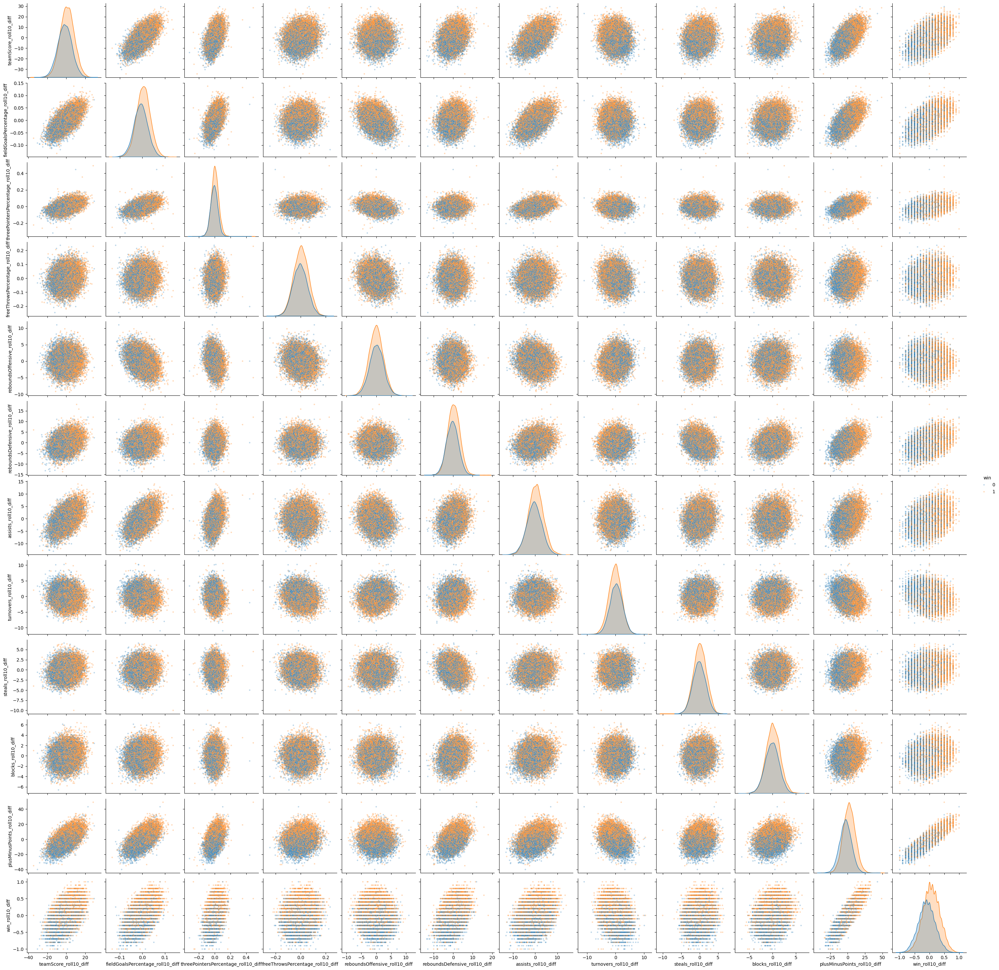

In [64]:
sns.pairplot(
    matchup_clean,
    vars=diff_cols,
    hue='win',
    plot_kws={'alpha': 0.3, 's': 10}
)